In [ ]:
!pip install -Uqq fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.6 MB/s eta 0:00:00


In [ ]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [ ]:
!pip install nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 7.1 MB/s eta 0:00:00


In [ ]:
import nbdev

In [ ]:
from fastbook import *

In [ ]:
from fastai.vision.all import *

In [ ]:
path = untar_data(URLs.PETS)/'images'

def is_cat(x): return x[0].isupper()
dls = ImageDataLoaders.from_name_func(
    path, get_image_files(path), valid_pct=0.2, seed=42,
    label_func=is_cat, item_tfms=Resize(224))

learn = cnn_learner(dls, resnet34, metrics=error_rate)

learn.fine_tune(2)

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 140MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.174157,0.019853,0.007442,00:52


epoch,train_loss,valid_loss,error_rate,time
0,0.074943,0.045699,0.012179,00:52
1,0.036284,0.005269,0.002030,00:54


In [ ]:
doc(ImageDataLoaders)

In [ ]:
path = untar_data(URLs.CAMVID_TINY)
dls = SegmentationDataLoaders.from_label_func(
    path, bs=8, fnames = get_image_files(path/"images"),
    label_func=lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',
    codes= np.loadtxt(path/'codes.txt', dtype=str)
)

learn = unet_learner(dls, resnet34)
learn.fine_tune(8)

epoch,train_loss,valid_loss,time
0,2.854440,2.646111,00:02


epoch,train_loss,valid_loss,time
0,1.916304,1.586573,00:01
1,1.635995,1.231431,00:01
2,1.478202,1.127386,00:01
3,1.362737,0.964851,00:01
4,1.241863,0.780772,00:01
5,1.126813,0.720727,00:01
6,1.030288,0.691056,00:01
7,0.953905,0.696525,00:01


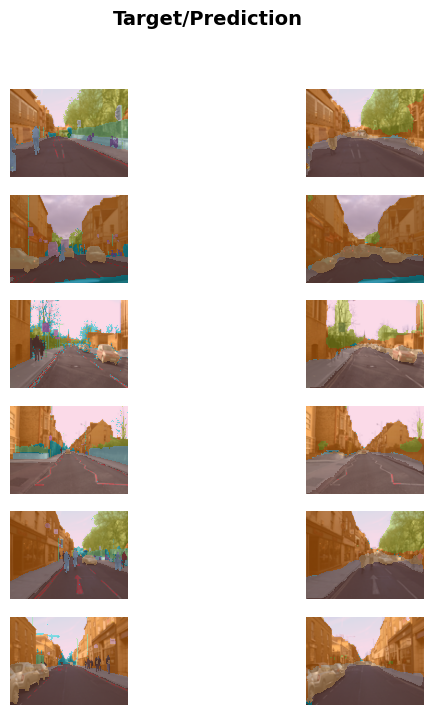

In [ ]:
learn.show_results(max_n=6, figsize=(7,8))

### Creating own Data Using duckduckgo search engine

In [ ]:
!pip install -Uqq duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 63.6 MB/s eta 0:00:00


In [ ]:
from duckduckgo_search import DDGS as ddgs

In [ ]:
from fastcore.all import *

In [ ]:
def search_images (keyword,max_images=200):
  return L(ddgs().images(keywords=keyword, max_results=max_images)).itemgot('image')

In [ ]:
keyword = 'Bear'
urls = search_images(keyword)
print(urls[0])

http://upload.wikimedia.org/wikipedia/commons/7/71/2010-kodiak-bear-1.jpg


In [ ]:
from fastdownload import download_url

In [ ]:
dest = 'bear.jpg'
download_url(urls[0], dest, show_progress=True)

Path('bear.jpg')

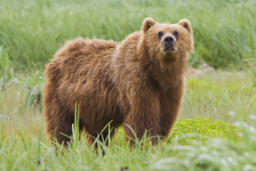

In [ ]:
from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256, 256)

In [ ]:
bear_types = 'grizzly', 'black', 'teddy'
path = Path('Bears')

In [ ]:
path

Path('Bears')

In [ ]:
if not path.exists():
  path.mkdir()
  for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images(f'{o} bear')
    download_images(dest, urls=results)

In [ ]:
??download_images

In [ ]:
fns = get_image_files(path)

In [ ]:
fns

(#572) [Path('Bears/teddy/079a08bf-320c-4283-b0b5-33c39a09f632.jpg'),Path('Bears/teddy/4eb8264d-62a6-4f6c-a144-c4fe474f937a.jpg'),Path('Bears/teddy/08f3a96f-5003-40a4-a259-5b01fa54e2db.jpg'),Path('Bears/teddy/184eabb3-00a9-474d-b696-d491a5630b7b.JPG'),Path('Bears/teddy/55ea17c1-ec6b-47ec-b4dc-f448ccf0c5b1.jpg'),Path('Bears/teddy/1de0be36-aadc-49c3-8a6f-6d80b4f654ee.jpeg'),Path('Bears/teddy/97f4d7a0-6e34-49f3-95a7-cba105919048.jpg'),Path('Bears/teddy/fbe9b345-47f3-45f0-a887-6501c1d4a1f9.jpeg'),Path('Bears/teddy/7dd3acec-78cf-43a7-8d25-921374c44459.jpg'),Path('Bears/teddy/79355de7-a936-4f8d-8591-a2d07c83af7e.JPG')...]

In [ ]:
failed = verify_images(fns)
failed

(#15) [Path('Bears/teddy/184eabb3-00a9-474d-b696-d491a5630b7b.JPG'),Path('Bears/teddy/97f4d7a0-6e34-49f3-95a7-cba105919048.jpg'),Path('Bears/teddy/e9551113-acbc-4b43-b98c-e5c60cd4bb63.JPG'),Path('Bears/teddy/36b62cc6-898d-4f0a-8e7d-c65cfb1b86c4.JPG'),Path('Bears/teddy/fc4f94e6-fa42-4cbb-bf1c-9637ce35b5c1.jpg'),Path('Bears/teddy/c525b4b7-311f-4320-b070-a5f86bb3e6a6.jpg'),Path('Bears/teddy/b8383c73-0a35-4f58-96bc-0b359f064197.jpg'),Path('Bears/teddy/5b512ea5-d39b-49ea-bc9c-307097e988ea.jpg'),Path('Bears/black/434d107e-2f7a-4c2b-a176-ad161966405f.jpg'),Path('Bears/black/932f024c-0146-42fa-9108-cd97a61e1d19.jpg')...]

In [ ]:
failed.map(Path.unlink)

(#15) [None,None,None,None,None,None,None,None,None,None...]

In [ ]:
dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed=42),
    get_y = parent_label,
    item_tfms = [RandomResizedCrop(192, min_scale=0.3)],
    batch_tfms=aug_transforms()
).dataloaders(path)

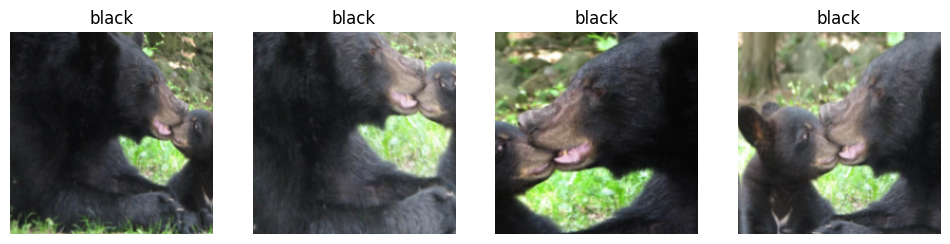

In [ ]:
dls.show_batch(max_n = 4, nrows=1, unique=True)

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 167MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.195802,0.093598,0.018018,00:29


epoch,train_loss,valid_loss,error_rate,time
0,0.197077,0.072105,0.018018,00:39
1,0.162131,0.122011,0.027027,00:24
2,0.127244,0.115540,0.018018,00:24
3,0.119240,0.118008,0.018018,00:23


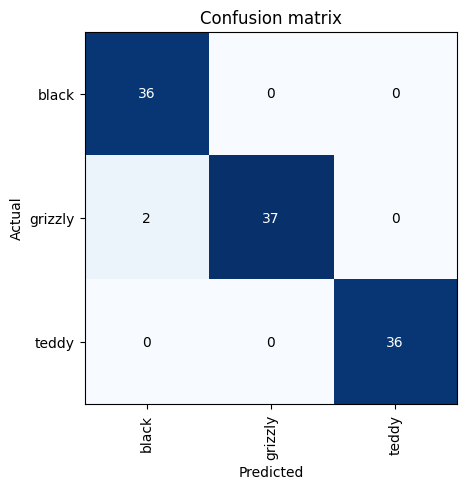

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

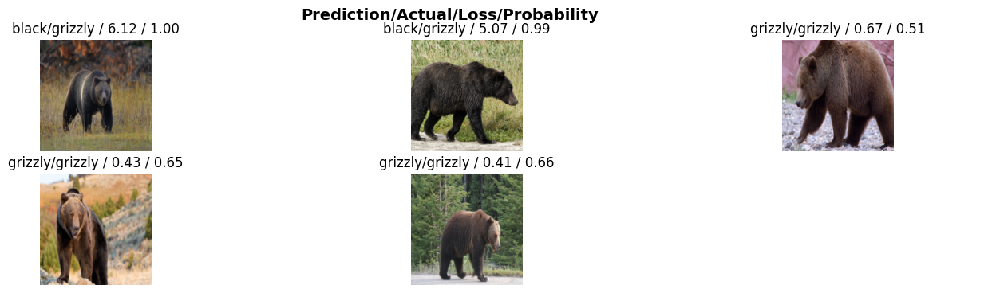

In [ ]:
interp.plot_top_losses(5, nrows=2, figsize=(17,4))

In [ ]:
from fastai.vision.widgets import *

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
learn.export('model.pkl')